<a href="https://colab.research.google.com/github/mgje/PIUMP/blob/master/coLab-Notebooks/Digitale_Experimente_in_der_Cloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CoLab collaborativ in der Cloud experimentieren

Mit Colaboratory oder kurz "Colab" können Sie Programme in Ihrem Browser schreiben und ausführen. Dazu ist keine Konfiguration erforderlich, sie können ihre digitalen Experimente auf einfache Weise freigeben.

![](https://github.com/mgje/PIUMP/blob/master/coLab-Notebooks/data/graph1.png?raw=true)

## Start, Bibliotheken importieren, etwas rechenen

In [1]:
# import bibliotheken
import numpy as np
from matplotlib.patches import Circle, Wedge, Polygon, Arrow, ArrowStyle
import matplotlib.lines as lines
from matplotlib.collections import PatchCollection
from matplotlib import animation,rc
from IPython.display import HTML
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

Starten Sie ein neues Projekt:
[https://colab.research.google.com/](https://colab.research.google.com/) oder beginnen Sie mit einem Beispiel [https://colab.research.google.com/notebooks/intro.ipynb#](https://colab.research.google.com/notebooks/intro.ipynb#)

In [2]:
Anz_Sekunden_eines_Tages = 24 * 60 * 60
Anz_Sekunden_eines_Tages

86400

In [3]:
# Wie häufig kommt der Buchstabe 'e' im folgenden Text vor ?

txt="""Bundesrat Alain Berset drückte aufs Tempo: Mehr impfen. Schneller impfen. Und so einen besseren Schutz vor dem
 mutierten und sich rasch ausbreitenden Coronavirus erreichen. Es war am 21. Januar, als der Gesundheitsminister vor 
 den Medien sagte: «Es muss möglich sein, jeden Tag 525 von 100 000 Einwohnern zu impfen – und das sieben Tage in der 
 Woche.» Hochgerechnet auf die ganze Schweiz machte das rund 45 000 Impfungen im Tag und 1,3 Millionen allein im Monat 
 Februar. Lediglich ein paar Tage später korrigiert der Bund seine Impfziele aber klammheimlich nach unten – wegen der 
 Engpässe bei den Impfstoff-Lieferungen. Jetzt lautet das Ziel für den Februar nur noch: 380 Impfungen pro 100 000 
 Einwohner und Tag – und das auch nur noch wochentags. Das geht aus einem vertraulichen Papier des Bundesamts für 
 Gesundheit hervor, das dieses am Mittwoch den Kantonen geschickt hat.
"""
zahl = 0
for buchstabe in txt:
  if buchstabe == "e":
    zahl = zahl + 1

"e kommt {} mal vor".format(zahl)


'e kommt 99 mal vor'

In [4]:
a=np.arange(1,6.5,0.5)
len(a)

11

## Mit Daten arbeiten

Sie haben mit einer Klasse 3 Prüfungen durchgeführt und möchten die Notenverteilung vergleichen.

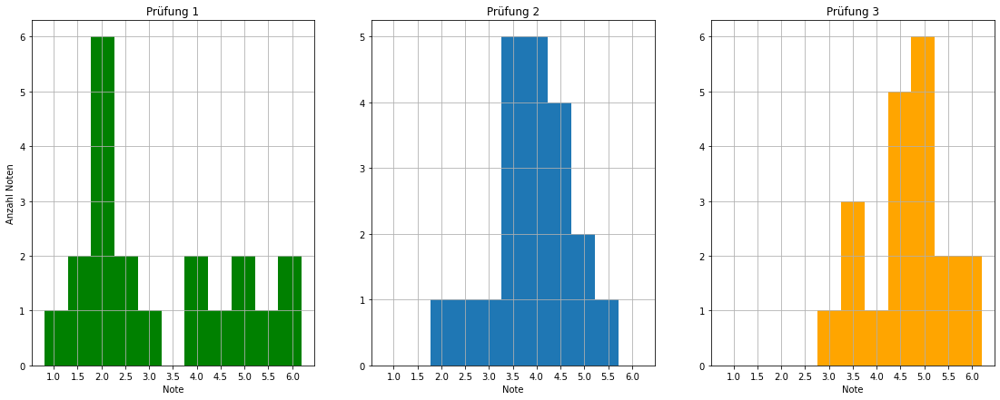

In [5]:
prue1 = [6,6,5,5.5,5,4.5,4,4,3,2,2.5,2,1.5,2,2,1.5,1,2,2.5,2]
prue2 = [5.5,5,4.5,5,4.5,4.5,4,4,4,4,4.5,4,3.5,3.5,3.5,3,2.5,2,3.5,3.5]
prue3 = [6,6,5.5,5.5,4.5,4.5,4.5,5,5,5,5,5,5,4.5,4.5,4,3.5,3.5,3,3.5]

fig, axs = plt.subplots(1,3,figsize=(19,7))

plt.setp(axs,xticks=[x for x in np.arange(1,6.5,0.5)])


axs[0].hist(prue1,bins=11,facecolor="g",align="mid",range=(0.8,6.2))
axs[0].set_title("Prüfung 1")
axs[0].set_ylabel("Anzahl Noten")
axs[0].set_xlabel("Note")
axs[0].grid()

axs[1].hist(prue2,bins=11,align="mid",range=(0.8,6.2))
axs[1].set_title("Prüfung 2")
axs[1].set_xlabel("Note")
axs[1].grid()

axs[2].hist(prue3,bins=11,facecolor="orange",align="mid",range=(0.8,6.2))
axs[2].set_title("Prüfung 3")
axs[2].set_xlabel("Note")
axs[2].grid()


plt.show()


## Berechnungen, Simulationen, Animationen

Fallender Stein von einer 20 m Brücke

![](https://www.leifiphysik.de/sites/default/files/images/25d8ba18cef430f5ae3d5199190d2416/992Wurf_von_der_Brücke.webp)

In [6]:
g = 9.81
h = 36

def f(t):
  return h-0.5*g*t**2

fig, axa = plt.subplots(1,2,figsize=(16,8))
ax = axa[0]
ax2 = axa[1]
plt.close()


def brueck():
  out = []
  for x in np.arange(-16,16.2,0.3):
    out.append([x,h-(x/8*3)**2])
  return out

bruecke = Polygon(brueck(),closed=False)
p=ax.add_patch(bruecke)
p.set_alpha(0.5)
p.set_color("yellow")

x=[-20,20]
y=[0,0]

line2, =ax.plot(x,y,"-",color="black",linewidth=9)


patch = Circle([0,h],0.75)
ax.set_xlim(-20,20)
ax.set_ylim(-2,38)

ax2.set_xlim(0,2)
ax2.set_ylim(-2,38)
ax2.set_title("s(t)-Diagramm")
ax2.set_xlabel('Time [s]')
ax2.set_ylabel('Height [m]')

line, =ax2.plot([],[], lw=3)

def init():
  patch.center = (0,h)
  ax.add_patch(patch)

  line.set_data([],[])

  return [patch,line]

def animate(i):
  t = i*0.014
  patch.center = (0,f(t))
  x = np.arange(0,t,0.05)
  y = h-0.5*g*x*x
  line.set_data(x,y)
  
  return [patch,line]



#frames ist die Anzahl Frames die berechnet werden. 
#für 200 Frames braucht es ca. 20 Sekunden Rechnerzeit
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=210, interval=10, blit=True)

                               
rc('animation',html='jshtml')
anim

In [7]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation,rc

fig = plt.figure()
fig.set_dpi(100)
fig.set_size_inches(7, 6.5)

ax = plt.axes(xlim=(0, 10), ylim=(0, 10))
patch = plt.Circle((5, -5), 0.75, fc='y')
plt.close()

def init():
    patch.center = (5, 5)
    ax.add_patch(patch)
    return patch,

def animate(i):
    #x, y = patch.center
    x = 5 + 3 * np.sin(np.radians(i*6))
    y = 5 + 3 * np.cos(np.radians(i*6))
    patch.center = (x, y)
    return patch,

anim = animation.FuncAnimation(fig, animate, 
                               init_func=init, 
                               frames=60, 
                               interval=20,
                               blit=True)

rc('animation',html='jshtml')
anim

## Bilder, Daten uploaden

In [8]:
from google.colab import files
import cv2
#uncomment for use
#uploaded = files.upload()


In [9]:
#b = mpimg.imread("3D93D3BD-AF0D-4B89-B120-261BF251DCA1.webp")
#plt.imshow(b)


## Tipps und Tricks

mathematische Formeln darstellen

$y=x^2$
 
$e^{i\pi} + 1 = 0$
 
$e^x=\sum_{i=0}^\infty \frac{1}{i!}x^i$
 
$\frac{n!}{k!(n-k)!} = {n \choose k}$
 
$A_{m,n} =
 \begin{pmatrix}
  a_{1,1} & a_{1,2} & \cdots & a_{1,n} \\
  a_{2,1} & a_{2,2} & \cdots & a_{2,n} \\
  \vdots  & \vdots  & \ddots & \vdots  \\
  a_{m,1} & a_{m,2} & \cdots & a_{m,n}
 \end{pmatrix}$

 ### Tabellen darstellen

 First column center  | Second align right  
:------------------:  | ------------------:
Row 1, Col 1          | Row 1, Col 2      
R2, C1                | Row 2, Col 2      







### Kuchendiagramm & 3d Plot

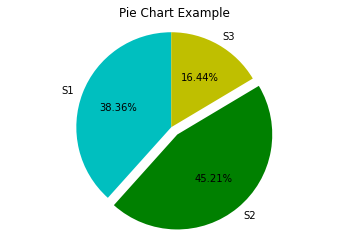

In [10]:
import matplotlib.pyplot as plt

labels = 'S1', 'S2', 'S3'
sections = [56, 66, 24]
colors = ['c', 'g', 'y'] 
plt.pie(sections, labels=labels, colors=colors,
        startangle=90,explode = (0, 0.1, 0),        
        autopct = '%1.2f%%') 
plt.axis('equal') # Try commenting this out.
plt.title('Pie Chart Example')
plt.show()

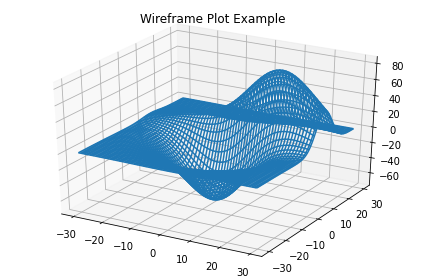

In [11]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d') 
x, y, z = axes3d.get_test_data() 
ax.plot_wireframe(x, y, z, rstride = 2, cstride = 2) 
plt.title("Wireframe Plot Example")
plt.tight_layout()
plt.show()

## Weitere Beispiele


* [Numerical Solutions for PDEs](https://colab.research.google.com/drive/1lIJ6guEAH5NQObefYBJ7S_Jm21IlJSOo)

* [MIT 6.S191](https://github.com/aamini/introtodeeplearning_labs) - Lab Materials for MIT 6.S191: Introduction to Deep Learning


* [Real Word NLP](https://github.com/mhagiwara/realworldnlp) - Example code for "Real-World Natural Language Processing"

* [Notebooks](https://github.com/zaidalyafeai/Notebooks) - Machine learning notebooks in different subjects optimized to run in google collaboratory 

* [Altair]( https://github.com/altair-viz/altair) - Declarative statistical visualization library for Python

* [Altair Curriculum](https://github.com/uwdata/visualization-curriculum) - A data visualization curriculum of interactive notebooks.







# Form und Bewegung einer Seifenblase in 2D


[2D Beispiel](https://a.carapetis.com/csf/)
[src code](https://github.com/acarapetis/curve-shortening-demo)

![](https://raw.githubusercontent.com/mgje/PIUMP/master/coLab-Notebooks/data/2DC25D2B-D576-469B-AE15-518373C201DF.jpeg)

Paper: A Model for Soap Film Dynamics with Evolving Thickness
SADASHIGE ISHIDA*, PETER SYNAK*, IST Austria FUMIYA NARITA, Unaffiliated
TOSHIYA HACHISUKA, The University of Tokyo
[Link](https://sadashigeishida.bitbucket.io/soapfilm_with_thickness/soapfilm_with_thickness.pdf)

Paper: MEAN CURVATURE FLOW
TOBIAS HOLCK COLDING, WILLIAM P. MINICOZZI II, AND ERIK KJÆR PEDERSEN
[Link](https://www.google.ch/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&ved=2ahUKEwjDjLjot9XuAhVGAxAIHRmYCrUQFjADegQIBBAC&url=https%3A%2F%2Fcore.ac.uk%2Fdownload%2Fpdf%2F85123414.pdf&usg=AOvVaw2Sa0jD-dEHmuQHHKIfh9hU)

Paper: On curvature approximation in 2D and 3D parameter–free shape optimization, Oliver Schmitt & Paul Steinmann 
[Link](https://link.springer.com/article/10.1007/s00158-016-1595-y)

Paper: THE NORMALIZED MEAN CURVATURE FLOW FOR A SMALL BUBBLE IN A RIEMANNIAN MANIFOLD, N.D. Alikakos and A. Freire
[Link](https://projecteuclid.org/euclid.jdg/1090426942)

## 2D Kurve in GeoGebra erstellen und einlesen

1. in GeoGebra eine geschlossene Kurve zeichnen
2. Die Figur als PGF/TikZ herunterladen
3. Daraus die Koordinaten des Polygons kopieren






In [12]:
koord=[[1269.800484951474,289.36715252669416],[1275.4707032380702,289.1862184854567],[1281.1409215246665,289.0052844442193],[1284.2348914796607,289.36715252669416],[1287.328861434655,289.729020609169],[1287.8465830580471,290.6336908153562],[1291.452094743754,291.7728869480586],[1295.057606429461,292.912083080761],[1301.7509081774824,294.2858051399787],[1310.69797011467,296.5843557907876],[1319.6450320518575,298.88290644159645],[1330.8458541782115,302.1062856839966],[1351.595455277866,306.2072934762454]  ,[1421.3617534974355,318.23596558306775],[1440.0800705443964,321.18499355554354],[1447.218324565362,322.1044131583974],[1450.2305665538092,323.0474344257967],[1453.2428085422564,323.99045569319605],[1452.1290384981855,324.95707862514064],[1459.853504239267,327.85890326852564],[1495.939520559734,339.887575375348],[1507.7383696128868,344.17739648395985],[1514.7733661929606,347.9200123463582],[1527.2140680374723,351.9162474821703],[1539.654769881984,355.91248261798245],[1557.5011769909338,360.16233702720837],[1572.9230220433972,363.94491958899266],[1613.8205072065932,373.56785727445055],[1626.2988643213491,376.09290168378146],[1638.2582955548862,377.8276797881006],[1647.5007891056957,380.7850605385439],[1656.7432826565052,383.7424412889872],[1663.2688385245883,387.92242468555474],[1664.340930055247,388.00226380263734],[1665.4130215859059,388.08210291971994],[1661.0316487791406,384.0617977573179],[1678.775336583434,392.81373264536626],[1760.5703069098258,436.1169522299267],[1801.4677920730219,457.7685620222069],[1809.6864233313281,461.8630174789466],[1817.6273660497984,465.52188381489884],[1825.5251362866666,467.39149970766476],[1833.4229065235347,469.2611156004307],[1841.2775042787998,469.34148105001043],[1864.016887028498,481.82590623585156],[1886.7562697781964,494.3103314216927],[1924.3804375223267,519.1988163437953],[1948.2175917762547,534.7520635058698],[1972.0547460301827,550.3053106679444],[1982.1048867939091,556.5233200699901],[1991.520811360815,561.215142140879],[2000.936735927721,565.906964211768],[2009.7184442978064,569.0725989514998],[2015.5781555744597,573.2438142477014],[2021.437866851113,577.415029543903],[2024.375581034334,582.591825396574],[2027.606827681282,585.2724863545237],[2030.8380743282303,587.9531473124734],[2034.3628534389054,588.1376733757018],[2037.2297653667401,590.0839551972526],[2040.0966772945749,592.0302370188035],[2042.3057220395697,595.7382745986773],[2044.4469686308335,597.3011584613461],[2046.5882152220972,598.8640423240148],[2048.66166365963,598.2817724694788],[2051.6641718949268,599.7068928827105],[2054.6666801302235,601.1320132959421],[2058.5982481632855,604.5645239769414],[2061.287109580385,606.9240961468039],[2063.975970997484,609.2836683166664],[2065.4221257986214,610.5703019753919],[2068.504312844478,611.7355649895328],[2071.586499890335,612.9008280036737],[2076.304719180912,613.94472037323],[2078.127250529936,616.5470338322617],[2079.9497818789605,619.1493472912935],[2078.87662528643,623.3100818398007],[2080.5329849513005,626.1699715177197],[2082.1893446161707,629.0298611956387],[2086.575220538441,630.5889060029692],[2090.1559226367585,630.9814403604486],[2093.736624735076,631.3739747179279],[2096.5121530094398,630.5999986255563],[2099.778860322216,630.9814403604486],[2103.0455676349925,631.3628820953409],[2106.80345398618,632.8997416574965],[2109.401798007674,633.387174781813],[2112.0001420291683,633.8746079061294],[2113.4389437209675,633.312614592607],[2114.213266850403,640.6043780459064],[2114.987589979839,647.8961414992058],[2115.0974345469117,663.0416617193268],[2114.213266850403,674.284659945009],[2113.3290991538947,685.5276581706912],[2111.4509191938046,692.8681344019345],[2109.401798007674,700.7477385800181],[2107.352676821544,708.6273427581017],[2105.1326144093737,717.0460748830249],[2104.590329164945,732.0222860577562],[2104.0480439205166,746.9984972324876],[2105.183535843828,768.532187457027],[2104.590329164945,784.9484433277745],[2103.9971224860624,801.364699198522],[2101.6752172049833,812.663520715477],[2104.590329164945,833.0631317550639],[2107.505441124907,853.4627427946507],[2115.657570325909,882.9631433568687],[2123.836204535861,912.4523676600912],[2132.0148387458125,941.9415919633137],[2140.219977964714,971.4196400075413],[2145.487814328141,987.0301347223898],[2150.7556506915685,1002.6406294372383],[2153.086184199523,1004.3835708227075],[2152.7050175922345,1006.2760100933056],[2152.323850984946,1008.1684493639036],[2149.2309842624145,1010.2103865196302],[2145.487814328141,1020.7104166214923],[2141.744644393868,1031.2104467233544],[2137.3511712478535,1050.1685697713515],[2133.459142221319,1064.0136362060528],[2129.5671131947843,1077.858702640754],[2126.176528287728,1086.590712462159],[2123.836204535861,1102.5053869478843],[2121.4958807839935,1118.4200614336096],[2120.205818187315,1141.5174005836545],[2119.0247356931322,1162.648747481996],[2117.8436531989496,1183.7800943803375],[2116.771550807263,1202.9454490269754],[2114.213266850403,1217.9806391733787],[2111.6549828935435,1233.015829319782],[2107.6105173715086,1243.9208549659488],[2104.590329164945,1256.4723899152102],[2101.5701409583817,1269.0239248644716],[2099.5742300672887,1283.2219691168273],[2097.373125900852,1292.5584062356772],[2095.172021734415,1301.8948433545272],[2092.765724292634,1306.3696733398717],[2090.1559226367585,1311.804281606593],[2087.546120980883,1317.238889873314],[2084.7328151109145,1323.6332764214117],[2082.938719372665,1326.2386881347797],[2081.144623634416,1328.8440998481478],[2080.369738027887,1327.6605367267855],[2075.7215161085714,1328.6444225561443],[2071.073294189256,1329.628308385503],[2062.551735957155,1332.779643165584],[2046.852703052198,1343.078829084331],[2031.1536701472412,1353.3780150030777],[2008.2771625694288,1370.8250520604909],[1986.7093425180863,1386.3820486688915],[1931.3774508267034,1424.8737994107228],[1917.8725117115375,1434.1415973847643],[1911.1217660060784,1439.0102371734567],[1902.5086377703296,1446.5254092030032],[1873.639824713956,1472.9884878380121],[1863.85965065937,1481.7746901730734],[1854.774813316236,1489.1853905727937],[1849.5824805003112,1494.6400976302925],[1844.3901476843864,1500.0948046877913],[1843.0903193956717,1503.5935184030673],[1839.9595428148534,1506.6687697371149],[1836.8287662340351,1509.7440210711625],[1831.8670413611126,1512.3958100239813],[1830.3366051293956,1513.8859730012082],[1828.8061688976786,1515.376135978435],[1830.707021307166,1515.7046729800697],[1823.119401865302,1516.2917074225727],[1815.531782423438,1516.8787418650757],[1798.4556911302218,1517.7242737484462],[1784.6276511234707,1521.1031762653015],[1770.7996111167197,1524.4820787821568],[1760.2196223964327,1530.3943519324962],[1736.5129626961811,1537.9433172148529],[1712.8063029959296,1545.4922824972095],[1675.9729723157118,1554.6779399115828],[1652.3122579484248,1559.594927007133],[1628.6515435811377,1564.5119141026832],[1618.1634455267804,1565.160230879409],[1609.0090383638642,1566.8121302712264],[1599.854631200948,1568.4640296630437],[1592.0339149294725,1571.1195116699523],[1580.1402253074907,1574.02933353532],[1568.246535685509,1576.9391554006875],[1552.2798727130216,1580.1033171245138],[1534.4312713015656,1586.0580056421422],[1516.5826698901096,1592.0126941597707],[1496.852130039684,1600.757909471201],[1479.099379610183,1607.7096154344224],[1433.3904256042579,1624.5497563839738],[1421.2091830364104,1629.279994755291],[1412.6216589092917,1633.5822748829123],[1409.3330813906132,1636.5784284907961],[1406.0445038719347,1639.57458209868],[1408.0548729616955,1641.2646091868257],[1402.1158781265199,1641.389897333525],[1396.1768832913442,1641.515185480224],[1382.2885245312323,1640.0757346854768],[1366.0298618060526,1636.5784284907961],[1349.771199080873,1633.0811222961154],[1331.142232390624,1627.5259607015],[1303.4807668505764,1624.5497563839738],[1275.8193013105288,1621.5735520664475],[1239.1253369206818,1621.1763050260106],[1221.6857965241845,1619.7382875412447],[1204.2462561276873,1618.300270056479],[1206.0611397245386,1615.821482127384],[1163.948170411437,1614.9268186985157],[995.5467609159242,1614.9268186985157],[955.2991429565673,1615.1320210560264],[960.8447292609075,1614.8529646996888],[959.4607445954572,1614.9268186985157],[958.0767599300069,1615.0006726973427],[949.7632042947653,1615.4274370513333],[940.2148692245414,1614.9268186985157],[930.6665341543176,1614.4262003456981],[919.8834196491106,1612.9981992860717],[916.1575250108967,1612.5210842771514],[912.4316303726829,1612.0439692682312],[915.7629556014626,1612.517740310018],[901.7231184827099,1610.115349855787] ,[827.1453514204113,1598.0866777489646],[752.5675843581128,1588.4637400635067],[702.0471615094589,1583.6522712207777],[622.6579256044313,1571.6235991139554],[597.5136781334755,1567.255657537516],[579.9308125791551,1563.527030203914],[567.3260339130485,1559.594927007133],[554.7212552469418,1555.6628238103522],[547.0945634690486,1551.5272447503926],[538.4572208566748,1547.5662549003107],[529.819878244301,1543.6052650502288],[520.1718847974465,1539.818864410025],[511.99414222166564,1535.5375827934884],[503.81639964588476,1531.2563011769516],[497.10890794117756,1526.480138584082],[490.3425324293854,1521.1031762653015],[483.57615691759327,1515.726213946521],[476.7508975987163,1509.74845190183],[471.09665705846965,1504.2630353157504],[465.442416518223,1498.7776187296706],[460.9591947566067,1493.7845476022028],[456.6622505302828,1489.8286287875635],[439.82210958073154,1475.3942222593766],[431.38957954853595,1467.8345010476403],[418.63518617517656,1455.6338251259779],[406.1418276816289,1441.7139403602741],[367.6500769397974,1396.0049863543493],[321.94112293387246,1343.078829084331],[305.2980512178557,1322.9635050959976],[287.3117214411822,1299.39371477054],[273.82643450658304,1280.529734128855],[260.34114757198387,1261.6657534871697],[251.3569034794587,1247.5075825292565],[244.9576214502094,1237.2265145442943],[238.55833942096007,1226.9454465593321],[234.7440194549866,1220.541481547321],[232.92894934338705,1215.5749047520142],[231.11387923178748,1210.6083279567074],[231.2980589745615,1207.0791393781049],[230.52321492202256,1203.5462326451918],[229.7483708694836,1200.0133259122788],[228.0145030216315,1196.476701025055],[225.71174607929362,1189.111826117005],[223.40898913695574,1181.746951208955],[220.53734310013195,1170.5538262800783],[218.49454281520022,1165.0544819033603],[216.4517425302685,1159.5551375266423],[215.23778799722865,1159.7495737020831],[213.68307397247128,1155.4315442179025],[212.1283599477139,1151.1135147337218],[210.232886431239,1142.2830195899205],[208.87160512974233,1136.1856688469868],[207.51032382824567,1130.088318104053],[206.68323474172718,1126.7241117619856],[206.46587070837785,1119.3455278974354],[206.46587070837785,1090.476714841062],[206.29087372190725,1080.3794470362716],[205.54851872914614,1071.5778728137232],[206.46587070837785,1064.0136362060528],[207.38322268760956,1056.4493995983823],[209.96028163883392,1050.122500605589],[211.2773395511068,1044.767760835137],[212.59439746337966,1039.4130210646852],[212.65145433670105,1035.0304405165746],[213.68307397247128,1030.3333543069502],[214.7146936082415,1025.636268097326],[216.72087600646037,1020.6246762261866],[218.49454281520022,1015.8989477787634],[220.26820962394007,1011.1732193313402],[221.8093608432009,1006.7333543076329],[223.30601165792916,1003.870275671941],[224.80266247265743,1001.0071970362492],[226.25481288285312,999.7209047885726],[228.1174805006581,996.6530724078476],[229.9801481184631,993.5852400271226],[232.2533329438772,988.7358675133495],[235.3346837647515,984.6244003010253],[238.4160345856258,980.5129330887011],[242.3055514019602,977.1393711778256],[244.9576214502094,975.0014626155674],[247.60969149845857,972.8635540533093],[249.02431477862254,971.9612988396677],[252.1748247143028,970.1899937728385],[255.32533464998303,968.4186887060093],[260.2117312411795,965.7783337859921],[264.20349682112516,965.3785249301095],[268.1952624010708,964.9787160742269],[271.2923969697655,966.8194532824782],[273.82643450658304,967.784259351474],[276.3604720434006,968.7490654204698],[278.33141254834084,968.8379403502105],[281.04363777067647,970.1899937728385],[283.7558629930121,971.5420471954666],[287.2093729327432,974.1572791109819],[290.66657545613435,975.0014626155674],[294.1237779795255,975.845646120153],[297.58467308657663,974.9187812138091],[300.28951314159224,975.0014626155674],[302.99435319660785,975.0841440173258],[304.9431381995882,976.1763717271862],[314.72391966977904,975.0014626155674],[324.5047011399699,973.8265535039487],[342.11747907737106,970.3845075708508],[350.8099359902461,967.784259351474],[359.5023929031212,965.1840111320972],[359.27452879147,963.4255606264408],[377.27301462525526,962.9727905087451],[449.4450472661894,962.9727905087451],[467.3937582941166,962.5726503561757],[467.06634457074887,960.9194597807713],[471.09665705846965,960.5670560873806],[475.1269695461904,960.2146523939899],[483.515008245,961.163035582613],[490.3425324293854,962.9727905087451],[497.17005661377084,964.7825454348772],[502.4370662837322,967.453672098518],[514.3998766430301,970.1899937728385],[526.362687002328,972.926315447159],[545.0212980509623,975.727832132159],[557.7030962275905,977.4071970369318],[570.3848944042188,979.0865619417046],[577.0898797088408,979.6437750662494],[584.1661748625997,979.8129314582964],[613.0349879189735,979.8129314582964],[661.1496763462628,979.8129314582964],[673.6772310772909,979.4447992726367],[677.4901197428047,978.3901466640606],[682.8012861385431,977.4071970369318],[688.1124525342815,976.4242474098031],[694.9218966602442,975.5130007641214],[699.6414270880944,975.0014626155674],[704.3609575159445,974.4899244670135],[706.9905742456817,974.3780948155867],[709.2643647735522,975.0014626155674],[711.5381553014226,975.6248304155482],[713.456119627426,976.9833956669374],[718.8873024590101,977.4071970369318],[724.3184852905943,977.8309984069263],[733.2628866277589,977.320035895526],[750.1618499367482,977.4071970369318],[767.0608132457376,977.4943581783377],[791.9143385265509,978.1796429725503],[812.7109448922245,977.4071970369318],[833.5075512578981,976.6347511013134],[850.2472387084322,974.4045744358634],[870.4485710049718,970.1899937728385],[890.6499033015114,965.9754131098136],[914.3128804440565,959.7764284492137],[937.8091348031769,950.9441184019228],[961.3053891622973,942.1118083546319],[984.634920737993,930.6461729206492],[1002.7639641800176,922.0753053455492],[1043.6614493432137,902.8294299746334],[1053.5013357560322,897.8305218950355],[1060.2525532733164,893.5088054520569],[1070.1245279782229,885.9892890250821],[1079.9965026831294,878.4697725981074],[1092.9892345756573,867.7524561871362],[1098.9933410345964,861.9319448114375],[1104.9974474935354,856.1114334357387],[1104.012928518885,855.1877270953128],[1103.8048098773254,852.3090071259796],[1103.5966912357658,849.4302871566465],[1104.164972927296,844.5965535584066],[1103.8048098773254,837.8746005977928],[1101.3990754559609,809.0057875414192],[1100.642111876039,795.4690997686472],[1100.4167925076658,777.0058965460909],[1098.9933410345964,763.2968335354943],[1097.569889561527,749.5877705248978],[1094.94830598376,740.6328477262607],[1091.776137770503,727.2108172150273],[1082.1532000850452,681.5018632091023],[1079.4251834615923,667.104077938241],[1077.6919030634342,656.1976456203482],[1074.9359968209517,647.8215813099998],[1072.1800905784692,639.4455169996514],[1068.401558491662,633.5998206968471],[1065.3130591354939,626.1699715177197],[1062.2245597793258,618.7401223385922],[1059.8260931537973,609.7261202831414],[1058.0958558714005,602.112627304075],[1056.3656185890038,594.4991343250085],[1055.3036106497384,588.2861504223259],[1053.2843870286715,582.8667519331592],[1051.2651634076046,577.4473534439925],[1048.2887241047358,572.8215403683417],[1046.0671837645782,566.026610983608],[1043.8456434244206,559.2316815988742],[1042.3790020469746,550.2676359050569],[1041.2557149218492,544.3750011913278],[1040.1324277967237,538.4823664775987],[1039.3524949239186,535.661142743958],[1036.4442460791201,529.9405946631409],[1024.4155739722978,508.2889848708607],[1020.3317155270661,500.977795587391],[1017.2005634533939,494.97528944844464],[1014.79263628684,489.043109499945],[1012.3847091202861,483.11092955144534],[1010.7000068608504,477.2490757933922],[1007.5754330227466,472.2029685503937],[1004.4508591846427,467.15686130739516],[999.8864137678703,462.9265005794515],[997.9524953372887,460.17429644357134],[996.0185769067072,457.4220923076912],[996.7151854623154,456.14804476387434],[995.5467609159242,452.95709317947797],[994.378336369533,449.7661415950816],[991.3448787211419,444.6582859701055],[990.7352920731953,440.9284210726556],[990.1257054252487,437.19855617520574],[991.9399897777471,434.8466820052823],[990.7352920731953,431.30548338719774],[989.5305943686435,427.7642847691132],[985.3069146070418,423.0337617028677],[985.9238232304664,421.68254570173985],[986.540731853891,420.331329700612],[991.9982288623419,422.3594207646016],[995.5467609159242,421.68254570173985],[999.0952929695065,421.0056706388781],[1000.7348600682207,417.6238294491648],[997.9524953372887,407.24813917355306],[995.1701306063568,396.8724488979413],[987.9658340457786,379.50290953643105],[978.706619966373,354.3219819035348],[969.4474058869673,329.1410542706385],[958.1332742887334,296.14873836635616],[949.8378069099992,267.71554273441393],[941.542339531265,239.2823471024717],[936.26553637203,215.40827174286963],[932.997665960448,202.76071335757334],[929.7297955488659,190.11315497227704],[928.4708578849367,188.69211356128648],[928.1861971177191,185.92057240802205],[927.9015363505015,183.14903125475763],[928.5911524799955,179.0269903592193],[928.1861971177191,176.2976347225642],[927.7812417554427,173.5682790859091],[926.2817149013965,172.23160870813726],[925.7804626963546,169.0804314584708],[925.2792104913126,165.92925420880434],[925.7762329352743,160.9635700872433],[925.7804626963546,157.05175935164846],[925.7846924574349,153.1399486160536],[925.2961295356336,150.28201126642495],[925.7804626963546,147.42882166619057],[926.2647958570756,144.5756320659562],[927.7220251003182,141.72719021511605],[932.997665960448,140.21161840209717],[938.2733068205778,138.6960465890783],[947.367359297595,138.51334481388062],[945.0263380672703,137.80588398073272],[942.6853168369456,137.0984231475848],[928.9092218992789,135.86620325648667],[952.2435413313638,135.40014955936823],[1065.3130591354939,135.40014955936823],[1094.6035237057026,135.5660907596254],[1092.7397190442834,135.5978606632785],[1094.1818721918676,135.40014955936823],[1095.6240253394517,135.20243845545795],[1100.372136296039,134.7752463439843],[1106.21054429869,137.80588398073272],[1112.048952301341,140.83652161748114],[1118.9776573500549,147.32498900245173],[1125.4564196696056,152.24029050891951],[1131.9351819891563,157.1555920153873],[1137.9640015795428,160.49772764335228],[1142.296560619157,164.26896261574186],[1146.629119658771,168.04019758813143],[1149.2654181476119,172.24053190494553],[1151.9194983046148,173.8919003011997],[1154.5735784616177,175.5432686974539],[1157.2454402867827,174.6456711731482],[1159.1367015687083,176.2976347225642],[1161.027962850634,177.9495982719802],[1162.1386235893203,182.1511228951179],[1163.948170411437,183.5148379866576],[1165.7577172335539,184.87855307819729],[1168.2661501391003,183.4044586381389],[1171.1653736755306,185.92057240802205],[1174.064597211961,188.43668617790522],[1177.3546113792745,194.94300815772993],[1180.7883113609885,197.9492445148444],[1184.2220113427024,200.95548087195886],[1187.7993971388155,200.46163160636306],[1190.4112490464463,202.76071335757334],[1193.023100954077,205.05979510878362],[1194.6694189732257,210.1518078767999],[1197.6284523105398,214.78938546439568],[1200.587485647854,219.42696305199146],[1204.8592343033336,223.61010545916662],[1207.2513899959977,226.81805757121802],[1209.6435456886618,230.02600968326942],[1210.1561084185107,232.2587715001971],[1212.0628588387267,234.03526083531142],[1213.9696092589427,235.81175017042574],[1217.2705473695264,237.13196702372665],[1219.28006210282,238.84672967804033],[1221.2895768361136,240.56149233235402],[1222.0076681921166,242.67080078768043],[1224.091530945549,246.06393294213376],[1226.1753936989815,249.4570650965871],[1229.6250278498435,254.13402095016716],[1233.7144686310069,258.0926050489561],[1237.8039094121702,262.05118914774505],[1242.5331568236336,265.2914014917428],[1245.7431407378292,267.71554273441393],[1248.9531246520248,270.13968397708504],[1250.6438450689523,271.74775411842944],[1252.9603440019225,272.5270115771429],[1255.2768429348928,273.30626903585636],[1258.2191203839059,273.25671381193877],[1260.177547266016,274.93274599850736],[1262.1359741481263,276.60877818507595],[1263.110550463333,280.01039778213055],[1264.9890161087449,282.1499492626008],[1266.8674817541566,284.289500743071],[1269.6498367297731,285.1669841069567],[1272.2062193728384,286.9614181053297],[1274.7626020159037,288.7558521037027],[1277.0930123264177,291.4672367365629],[1279.4234226369317,294.1786213694231]]

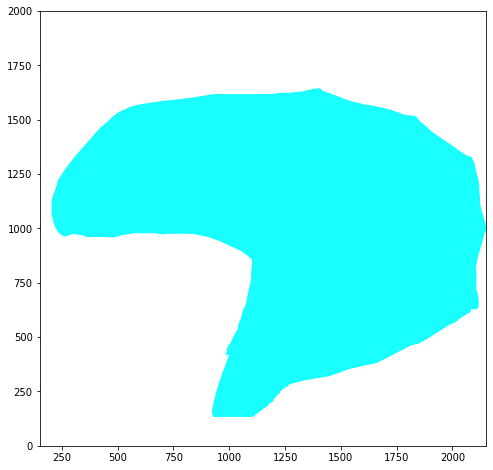

In [13]:
def plotPoly(data):

  
  fig, axa =plt.subplots(1,1,figsize=(8,8))
  axa.set_xlim(150,2150)
  axa.set_ylim(0,2000)

  
  shape=Polygon(data,closed=True)
  form=axa.add_patch(shape)
  form.set_alpha(0.9)
  form.set_color("cyan")

  return plt.show()


plotPoly(koord) 

### Punkte reduzieren

In [14]:
def reduce_sampling(curv,freq=4):
  return np.array(curv[::freq])

data2 = reduce_sampling(koord,freq=5)

len(data2),len(koord)

(109, 542)

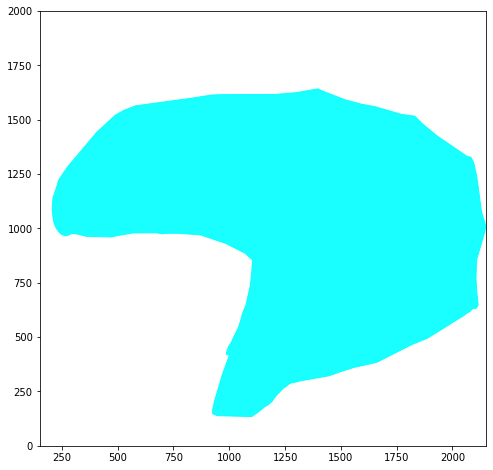

In [15]:
plotPoly(data2)

## Eigenschaften von 2D Kurven Berechnen

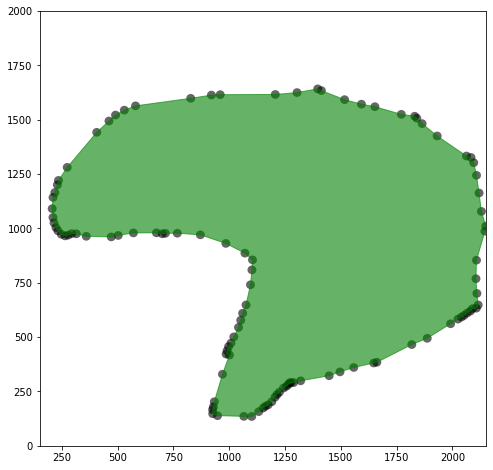

In [16]:

def plotPolyP(data):
  fig, axa =plt.subplots(1,1,figsize=(8,8))  
  shape=Polygon(data,closed=True)
  form=axa.add_patch(shape)  
  form.set_alpha(0.6)  
  form.set_color("green")          

  patch=[]
  for p in data:
    patch.append(Circle(p,radius=20))
  
  p = PatchCollection(patch,fc="black",alpha=0.6)
  dots = axa.add_collection(p)

  axa.set_xlim(150,2150)
  axa.set_ylim(0,2000)   
  return plt.show()

plotPolyP(data2)  

### homogenes Gitter durch gleich Verteilung
- in Dichten Bereichen werden Punkte zusammengeführt, 
- bei geringer Dichte werden Gitterpunkte hinzugefügt.

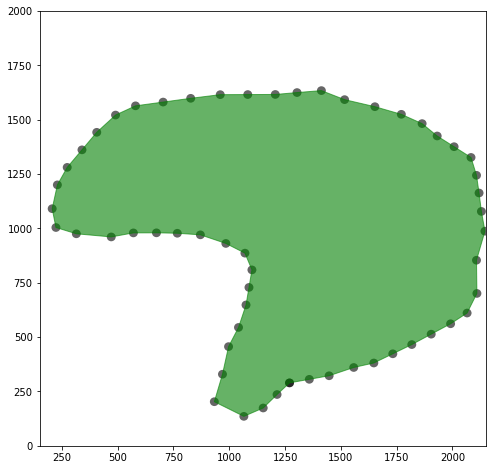

In [17]:
def reMesh(data,dist=80):
  dist2=dist**2
  newdata=[data[0]]
  lp = data[0]
  for i in range(1,len(data)-1):
    v = data[i]-lp
    d2 = np.dot(v,v)
    #print(d2)
    if d2 > dist2:
      if np.sqrt(d2)/dist>2:
        p2 = lp+0.5*v
        newdata.append(p2)

      newdata.append(data[i])
      lp = data[i]
    

  newdata.append(data[0])  
  return np.array(newdata)

plotPolyP(reMesh(data2))

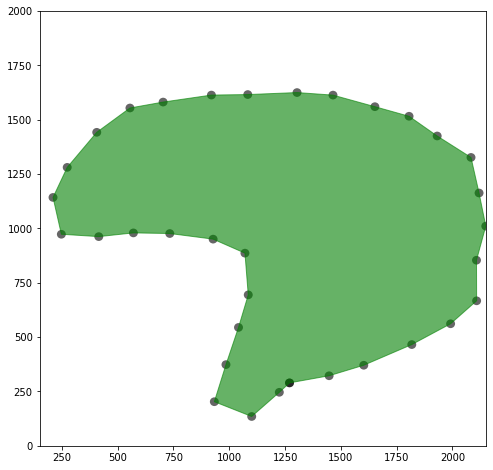

In [18]:
data3 = reMesh(data2,dist=20)
#print(data3)


data4 = reMesh(data3,dist=150)

plotPolyP(data4)

## Tangenten und Krümung mit Pfeilen visualsieren

In [19]:

def eukl_derivate(ps,scale=80):
  N = len(ps)  
  x = ps[:,0]  
  y = ps[:,1]  
  dsx = np.append(np.diff(x),x[1]-x[0]) #calc last difference  
  dsy = np.append(np.diff(y),y[1]-y[0]) #calc last difference  
  ds = np.sqrt(dsx*dsx+dsy*dsy)  
  Tx = dsx/ds  
  Ty = dsy/ds   
  
  # Second derivative & curvature  
  ds2= 0.5*(np.append(ds[-1],ds[0:-1])+ds)  
  #Hx = ndiff(Tx([end,1:end]))./ds2;  
  Hx = np.diff(np.append(Tx[-1],Tx[:]))/ds2*scale  
  Hy = np.diff(np.append(Ty[-1],Ty[:]))/ds2*scale  
  # fight against iregularities scale meaning full range  
  #boundary  
  Hx[0]=Hx[-1]  
  Hy[0]=Hy[-1]  
  Tx[-1]=Tx[0]  
  Ty[-1]=Ty[0]  
  #cx = np.abs(np.amax(Hx))  
  #cy = np.abs(np.amax(Hy))  
  #cx=cy=1

  return Tx,Ty,Hx,Hy

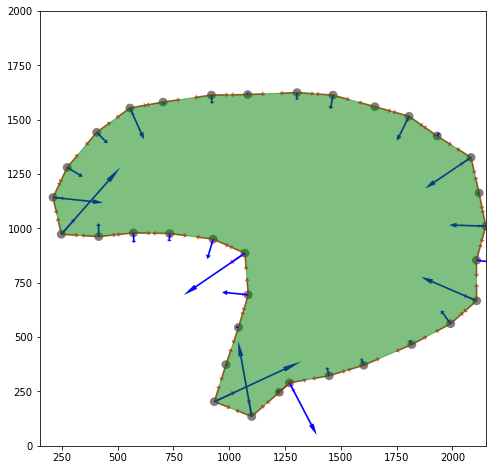

In [20]:
def plotPolyPTH(data,sc=80,pwidth=38):
  fig, axa =plt.subplots(1,1,figsize=(8,8))
  shape=Polygon(data,closed=True)
  form = axa.add_patch(shape)
  form.set_alpha(0.5)
  form.set_color('green')

  patch=[]
  for p in data:
    patch.append(Circle(p,radius=20))
  # remove last element boundary condition
  patch.pop(-1)
  
  p = PatchCollection(patch,fc="black",alpha=0.5)
  dots = axa.add_collection(p)
   
  Tx,Ty,Hx,Hy = eukl_derivate(data)

  T2x = np.append(Tx[-2],Tx[:-1])*-1
  T2y = np.append(Ty[-2],Ty[:-1])*-1
  
  tpfeile = []
  for i in range(len(data)-1):
    tp = Arrow(data[i][0],data[i][1],Tx[i]*sc,Ty[i]*sc,width=pwidth)
    tpfeile.append(tp)
    tp2 = Arrow(data[i+1][0],data[i+1][1],Tx[i]*sc*-1,Ty[i]*sc*-1,width=pwidth)
    tpfeile.append(tp2)
  #tpfeile.pop(-1)
  
  p2 = axa.add_collection(PatchCollection(tpfeile,fc="red",alpha=0.7))
  
  Ttx = Tx+T2x
  Tty = Ty+T2y

  ttot = []
  for i in range(len(data)-1):
    tt = Arrow(data[i][0],data[i][1],Ttx[i]*sc,Tty[i]*sc,width=pwidth)
    ttot.append(tt)
  p3 = axa.add_collection(PatchCollection(ttot,fc="magenta",alpha=0.99))

  cur = []
  for i in range(len(data)-1):
    cu = Arrow(data[i][0],data[i][1],Hx[i]*sc*9,Hy[i]*sc*9,width=pwidth)
    cur.append(cu)
  p4 = axa.add_collection(PatchCollection(cur,fc="blue",alpha=0.99))





  axa.set_xlim(150,2150)  
  axa.set_ylim(0,2000)     
  
  return plt.show()

plotPolyPTH(data4)

In [21]:
Tx,Ty,Hx,Hy = eukl_derivate(data4)

Tx,Ty,Hx,Hy

(array([ 0.9833988 ,  0.9547536 ,  0.91469864,  0.87610555,  0.74112508,
        -0.00319966,  0.25723769, -0.19437454, -0.21540966, -0.83813953,
        -0.81158579, -0.96104821, -0.96210248, -0.99735041, -0.99913703,
        -0.99989362, -0.98911035, -0.98362313, -0.7992202 , -0.63449338,
        -0.41790593,  0.21543639,  0.99790387,  0.99399159,  0.99984833,
         0.99126948,  0.91128291,  0.07704122, -0.2798792 , -0.31205957,
        -0.29200859,  0.92648667,  0.74346972,  0.72595268,  0.9833988 ]),
 array([ 0.18145742,  0.29739798,  0.4041366 ,  0.48211935,  0.67136698,
         0.99999488,  0.96634816,  0.98092739,  0.97652377,  0.54545589,
         0.58423327,  0.27638078,  0.27268812,  0.07274722, -0.04153541,
        -0.0145858 , -0.14717578, -0.18023743, -0.60103832, -0.7729283 ,
        -0.9084903 , -0.97651788, -0.06471376,  0.10945647, -0.01741601,
        -0.13185147, -0.41178085, -0.99702791, -0.96003522, -0.95006254,
        -0.9564157 , -0.37632758,  0.66876959,  0

In [32]:
def mean_flow_step(ps,iter=5,scale=1
                   
                   0.0):
  N = len(ps)  
  x = ps[:,0].copy()  
  y = ps[:,1].copy()  
  tmp = ps.copy()  
  for i in range(iter):
    Tx,Ty,Hx,Hy= eukl_derivate(tmp,scale=scale)    
    T2x = np.append(Tx[-2],Tx[:-1])    
    T2y = np.append(Ty[-2],Ty[:-1])    
    x1 = x + 256*Hx + Tx + T2x    
    y1 = y + 256*Hy + Ty + T2y    
  tmp=np.array(list(zip(x1,y1)))    
  #print(y,Hy*scale)    
  #Boundary    

  tmp[-1]=tmp[0]
  return tmp

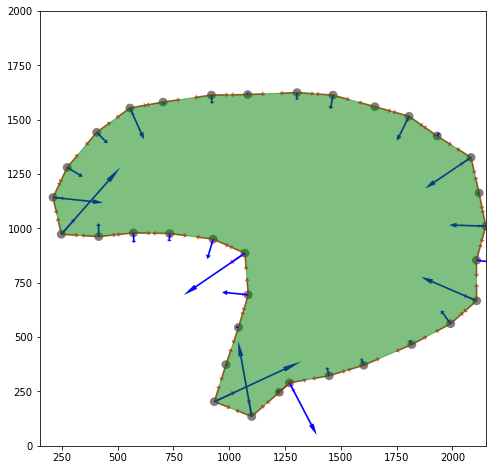

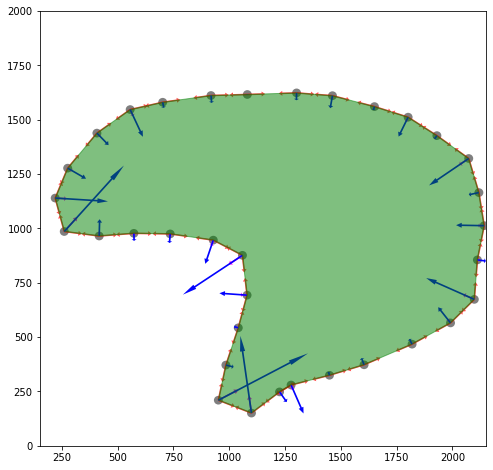

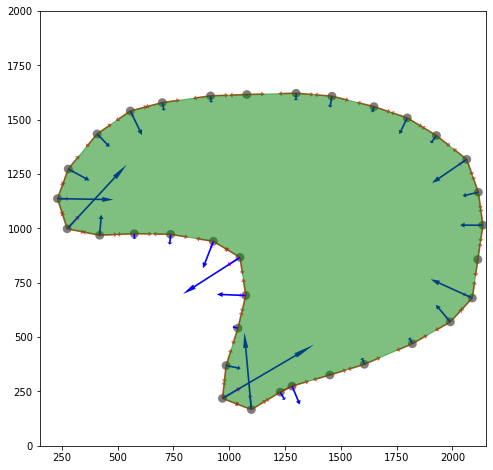

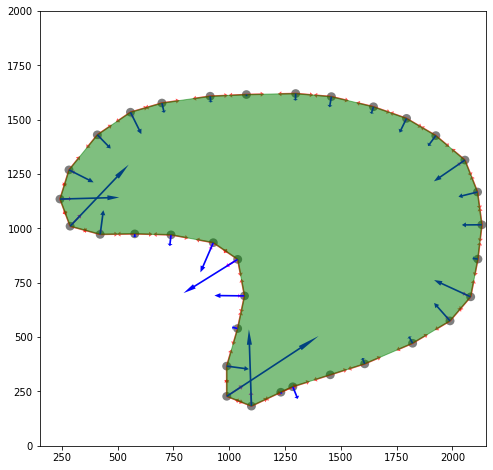

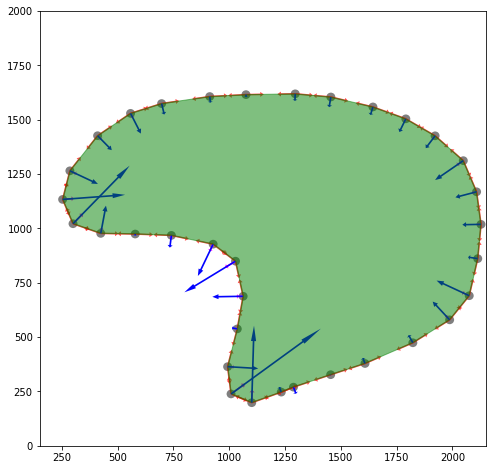

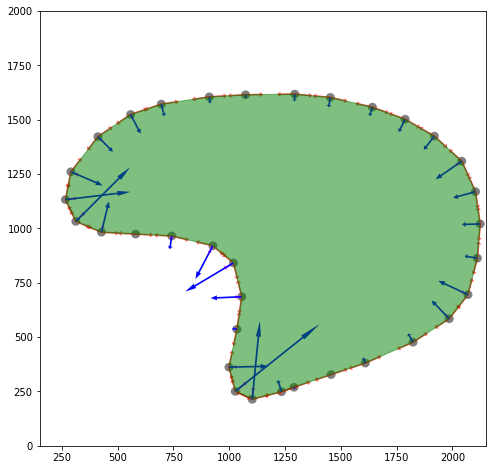

(35, 35)

In [33]:
plotPolyPTH(data4)
data5 = mean_flow_step(data4)
plotPolyPTH(data5)
data6 = mean_flow_step(data5)
plotPolyPTH(data6)
data7 = mean_flow_step(data6)
plotPolyPTH(data7)
data8 = mean_flow_step(data7)
plotPolyPTH(data8)
data9 = mean_flow_step(data8)
plotPolyPTH(data9)





len(data4),len(data5)


## Animation

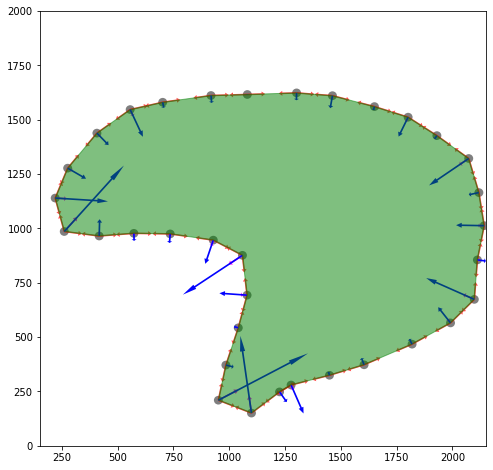

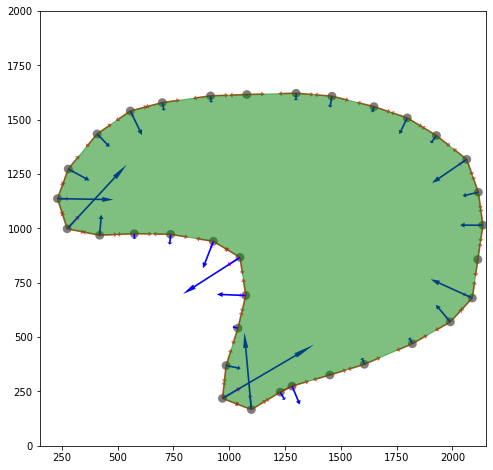

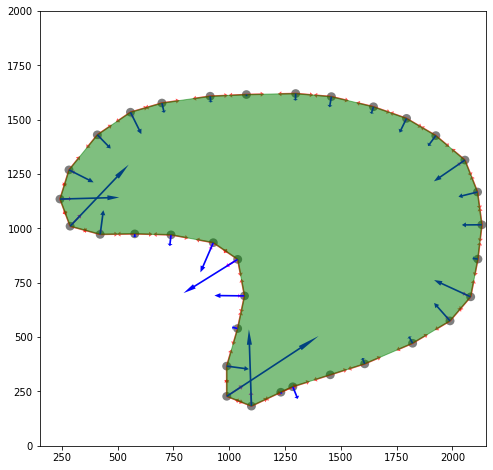

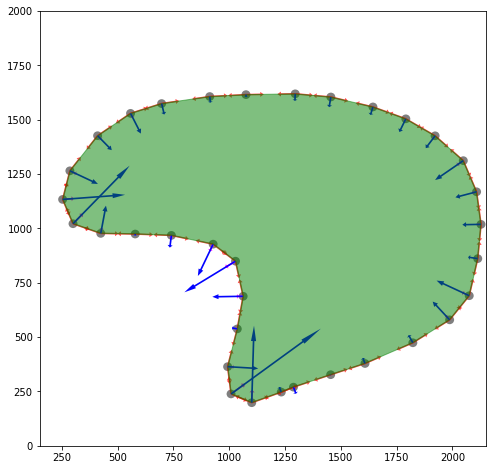

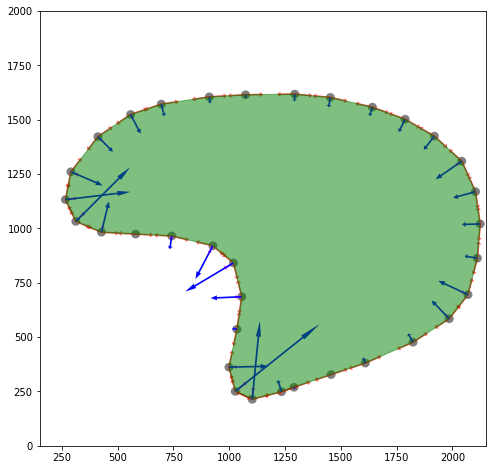

...

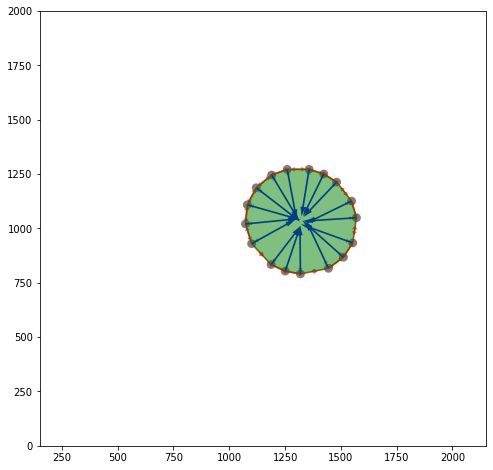

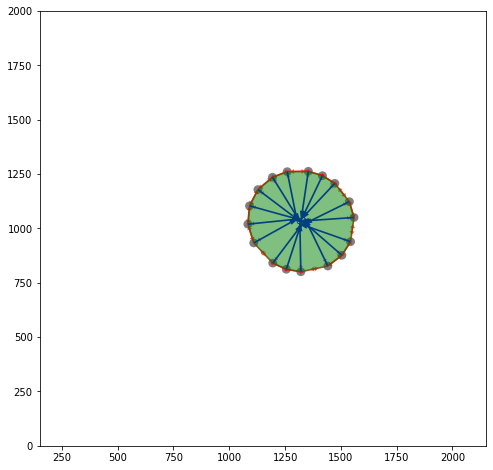

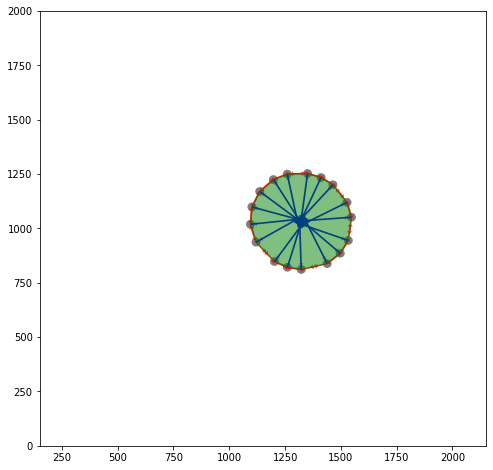

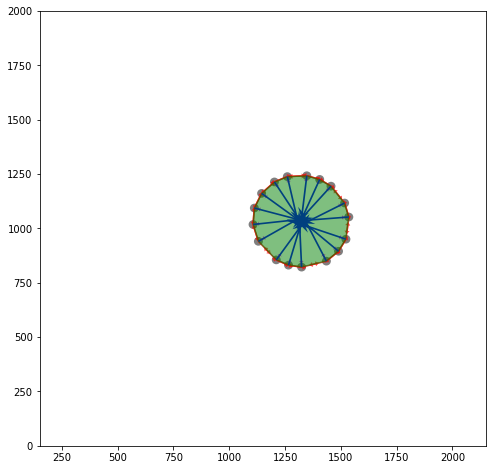

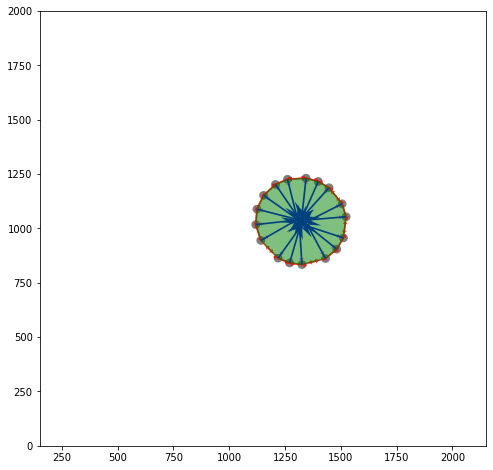

In [35]:
def render_mean_curvature(data,N=100,scale=10):
  tmp = np.copy(data)
  out = []
  for i in range(1,N+1):
    newt = mean_flow_step(tmp,scale=scale)
    out.append(plotPolyPTH(newt))
    if i%10==0:
      newt2 = reMesh(newt)
      newt = newt2.copy()
    tmp = newt.copy()

render_mean_curvature(data4)


## Literatur

# nicht mehr benützt

In [ ]:
g = 9.81 # m/s

h = 20  # m

#Funktion beschleunigte Bewegung
def f(t):
  return h-0.5*g*t**2

fig, ax = plt.subplots(1,1,figsize=(10,10))

patches = []


t = 0.2
pos=[0,f(t)]
ci = Circle(pos,radius=0.75)
patches.append(ci)

x =[-20,20]
y =[0,0]
line, = ax.plot(x,y,"-",color="black",linewidth=9)

def brue():
  out = []
  for x in np.arange(-12,12.1,0.2):
    d = [x,20-(x/8*3.0)**2]
    out.append(d)
  return out

bruecke = []
poly = Polygon(brue(),False)
bruecke.append(poly)



p = PatchCollection(patches,alpha=0.9,fc="green")
p3 = PatchCollection(bruecke,alpha=0.4,fc="blue")

ax.add_collection(p3)
ax.add_collection(p)
ax.set_xlim(-20,20)
ax.set_ylim(-10,30)


plt.show()

pos